In [1]:
import os
import sys
from pathlib import Path
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'src'))

import cv2
import numpy as np
import matplotlib.pyplot as plt
import itertools
plt.rcParams["figure.figsize"] = (24,18)

from ultralytics import YOLO
from cv_utils import *
from cv_pipeline import *
from houghlines_process import *
import itertools

In [2]:
model_path = os.path.join(os.path.dirname(os.getcwd()), 'models')
pitch_segment_model = smp.Unet("resnet34", encoder_weights="imagenet", activation=None, classes=7)
pitch_segment_model.load_state_dict(torch.load(os.path.join(model_path, "best res_unet_512.pth")))

player_detect_model = YOLO(os.path.join(model_path, "yolov8n_4th_train.pt"))

data_path = os.path.join(os.path.dirname(os.getcwd()), 'data')
vid_name = 'Liv-Ars 2nd half'
images_path = os.path.join(data_path, 'images' + '/' + vid_name)


0: 1152x2048 20 persons, 9.0ms
Speed: 12.8ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 1152, 2048)
/home/khoa-ys/Projects/venv_for_projects/football_analysis_venv/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/khoa-ys/Projects/venv_for_projects/football_analysis_venv/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


None
20
20
True



0: 1152x2048 2 persons, 7.5ms
Speed: 6.5ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 1152, 2048)


None
2
Interruption
2


ValueError: n_samples=2 should be >= n_clusters=3.

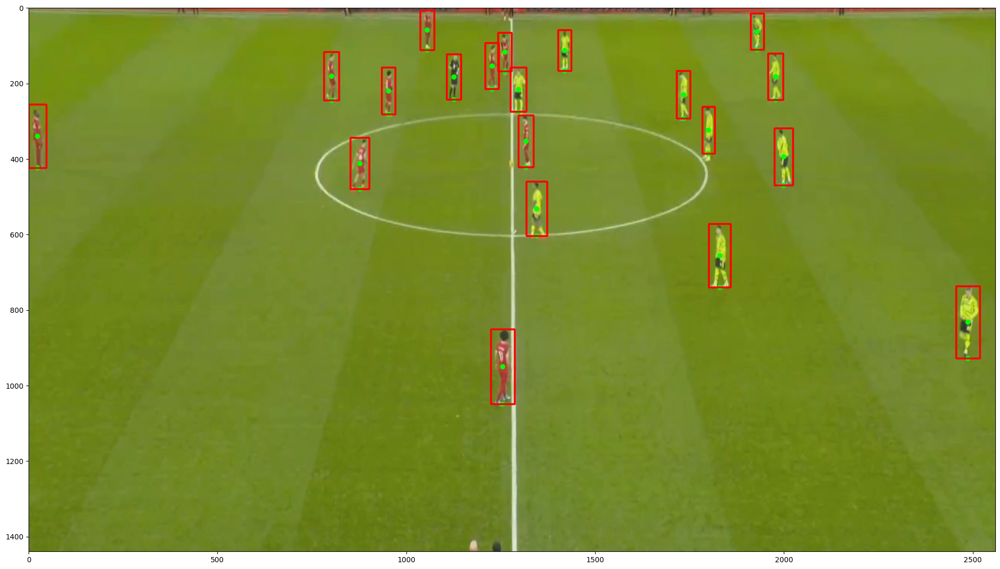

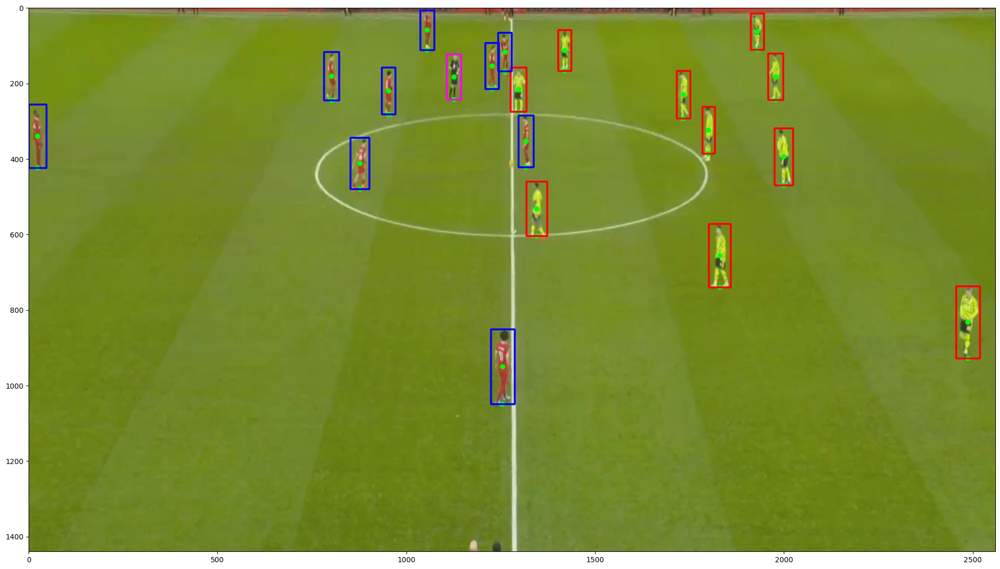

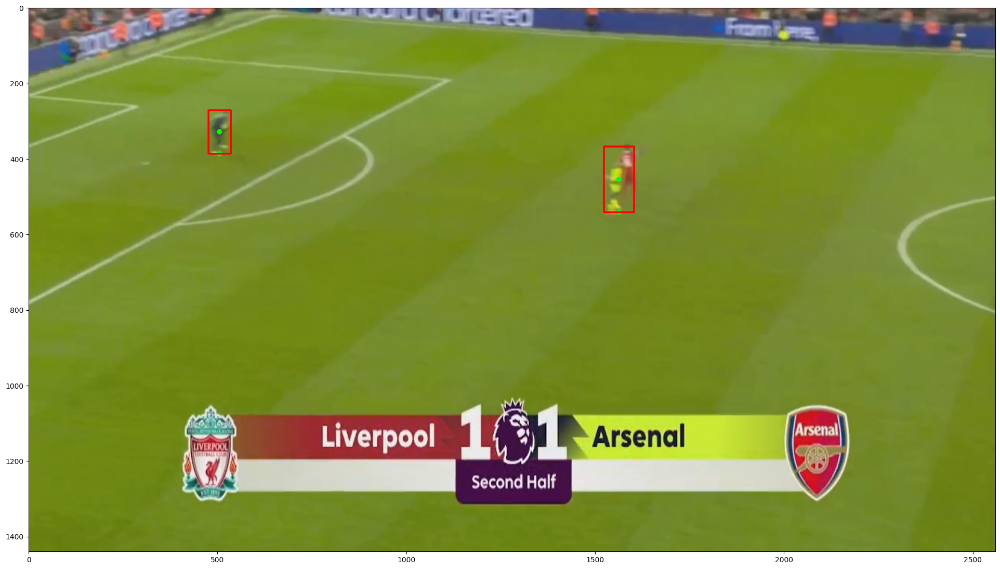

In [7]:
ball_possession = None

for frame_id in range(0, 41, 10):
    tracking_dict = {}
    # TODO: them 2 attribute: home_id, away_id, chua bounding box thuoc ve team do
    # home = {home_id: 1, bounding_box: bounding_box_home, box_coord}
    formation_dict = {'home_formation' : '433',
                    'home_position' : [22, 35, 6, 2, 4, 41, 20, 8, 19, 14, 9],
                    'home_color' : np.nan, 
                    'away_formation' : '433',
                    'away_position' : [31, 24, 6, 3, 2, 8, 20, 82, 47, 9, 19],
                    'away_color' : np.nan}

    # Load image
    frame = cv2.imread(os.path.join(images_path, sorted(os.listdir(images_path))[frame_id]),
                            cv2.IMREAD_UNCHANGED)
    orig_w, orig_h = frame.shape[:2]

    # Crop image to pitch by model
    predicted_mask, colored_mask = pitch_segment(frame, pitch_segment_model, device='cpu')
    pitch_area = cv2.inRange(predicted_mask, 41, 255)
    contours, rect, hull = detect_largest_contour(pitch_area)

    mask = np.zeros_like(frame)
    cv2.fillPoly(mask, [hull], (255, 255, 255))
    grass_mask = cv2.bitwise_and(frame, mask)

    startX, startY, w, h = rect
    endX, endY = startX + w, startY + h
    frame = cv2.resize(frame[startY:endY, startX:endX], (orig_h, orig_w))
    grass_mask = cv2.resize(grass_mask[startY:endY, startX:endX], (orig_h, orig_w))
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    grass_mask = cv2.cvtColor(grass_mask, cv2.COLOR_BGR2RGB)
    # plt.figure()
    # plt.imshow(frame)

    # Detect players on the field
    player_box_list, ball_box = model_predict(player_detect_model, frame)
    print(ball_box)
    print(len(player_box_list))
    if len(player_box_list) < 3:
        print("Interruption")
        continue
    
    visualize_team_players(frame, player_box_list, ball_box=ball_box)
    # Filter obscured player boxes / boxes that are too small
    player_box_list = filter_boxes_by_obscurity(player_box_list, threshold=20)
    print(len(player_box_list))
    # Filter out players from image to get grass color
    for box in player_box_list:
        cv2.rectangle(grass_mask, (box[0], box[1]), (box[2], box[3]),
                        (0, 0, 0), -1)

    # Differentiate teams by color
    color_list = player_color_from_frame(player_box_list, frame, grass_mask)
    if frame_id == 0:
        team_1_color, team_2_color = get_teams_average_color(color_list)

    if team_1_color is None or team_2_color is None:
        print("dm Phi")
        continue

    team_1_idx, team_2_idx, misc_idx = fix_annotation_by_color(color_list, team_1_color,
                                                            team_2_color, threshold=40)
    team_1_box = [player_box_list[i] for i in team_1_idx]
    team_2_box = [player_box_list[i] for i in team_2_idx]
    misc_box = [player_box_list[i] for i in misc_idx]
    print((len(team_1_box) + len(team_2_box) + len(misc_box)) == len(player_box_list))

    visualize_team_players(frame, team_1_box, team_2_box, misc_box, ball_box=ball_box)

    # Check and filter out players in collision
    team_1_uncollided, team_2_uncollided, misc_uncollided = check_collision(team_1_box, team_2_box, misc_box)
    ball_possession = check_possession(team_1_uncollided, team_2_uncollided, ball_box, ball_possession)

    # visualize_team_players(frame, team_1_uncollided, team_2_uncollided, misc_box, ball_box=ball_box)

    # Assign ids of all players presented on the field
    team_1_data = [team_1_idx, team_1_uncollided]
    team_2_data = [team_2_idx, team_2_uncollided]
    team_1_info = {
        "ball_possession": (ball_possession==1),
        "players": [
            {
                'idx': idx,
                'box': box_values,
            }
            for idx, box_values in zip(team_1_data[0], team_1_data[1])
        ]
    }
    team_2_info = {
        "ball_possession": (ball_possession==2),
        "players": [
            {
                'idx': idx,
                'box': box_values,
            }
            for idx, box_values in zip(team_2_data[0], team_2_data[1])
        ]
    }
    # print(team_1_info)
    # print(team_2_info)

    # Player tracking
    team_1_player_ids = {}
    
    for i, box in enumerate(sorted(team_1_box)):
        x, y, x2, y2 = box
        player_id = f"player_{x}_{y}_{x2}_{y2}"

        if player_id not in team_1_player_ids:
            team_1_player_ids[player_id] = len(team_1_player_ids) + 1
    # print("Team 1:", team_1_player_ids)
    
    team_2_player_ids = {}
    for i, box in enumerate(sorted(team_2_box)):
        x, y, x2, y2 = box
        player_id = f"player_{x}_{y}_{x2}_{y2}"

        if player_id not in team_2_player_ids:
            team_2_player_ids[player_id] = len(team_2_player_ids) + 1
    # print("Team 2:", team_2_player_ids)
    
    misc_player_ids = {}
    for i, box in enumerate(sorted(misc_box)):
        x, y, x2, y2 = box
        player_id = f"player_{x}_{y}_{x2}_{y2}"

        if player_id not in misc_player_ids:
            misc_player_ids[player_id] = len(misc_player_ids) + 1
    # print("Misc:", misc_player_ids)
    
    # Compare bounding boxes between two consecutive frames

#     for player_id in team_1_player_ids.keys():
#         prev_box = team_1_box[frame_id - 1][team_1_box[frame_id - 1].index(player_id)]
#         current_box = team_1_box[frame_id][team_1_box[frame_id].index(player_id)]

#         distance = calculate_distance(prev_box, current_box)

#         # Check if the distance is below a certain threshold
#         if distance < 30:
#             print(f"Player {player_id} in team 1 is close in consecutive frames.")
#     # Compare bounding boxes between two consecutive frames for team 2

#     for player_id in team_2_player_ids.keys():
#         prev_box = team_2_box[frame_id - 1][team_2_box[frame_id - 1].index(player_id)]
#         current_box = team_2_box[frame_id][team_2_box[frame_id].index(player_id)]

#         distance = calculate_distance(prev_box, current_box)

#         # Check if the distance is below a certain threshold
#         if distance < 30:
#             print(f"Player {player_id} in team 2 is close in consecutive frames.")

#     # Compare bounding boxes between two consecutive frames for misc players

#     for player_id in misc_player_ids.keys():
#         prev_box = misc_box[frame_id - 1][misc_box[frame_id - 1].index(player_id)]
#         current_box = misc_box[frame_id][misc_box[frame_id].index(player_id)]

#         distance = calculate_distance(prev_box, current_box)

#         # Check if the distance is below a certain threshold
#         if distance < 30:
#             print(f"Player {player_id} in misc players is close in consecutive frames.")
            
    # visualize_team_players(frame, team_1_box, team_2_box, misc_box, ball_box=ball_box, 
    #                        team_1_player_ids=team_1_player_ids, team_2_player_ids=team_2_player_ids, 
    #                        misc_player_ids=misc_player_ids)
    #     visualize_team_players(frame, team_1_box, team_2_box, misc_box, ball_box=ball_box)
    #     visualize_team_players(frame, team_1_uncollided, team_2_uncollided, misc_uncollided, ball_box=ball_box)
    #print(player_ids)
    # Pitch POI detection

    
    # Pitch coordinates mapping


    frame_id += 1


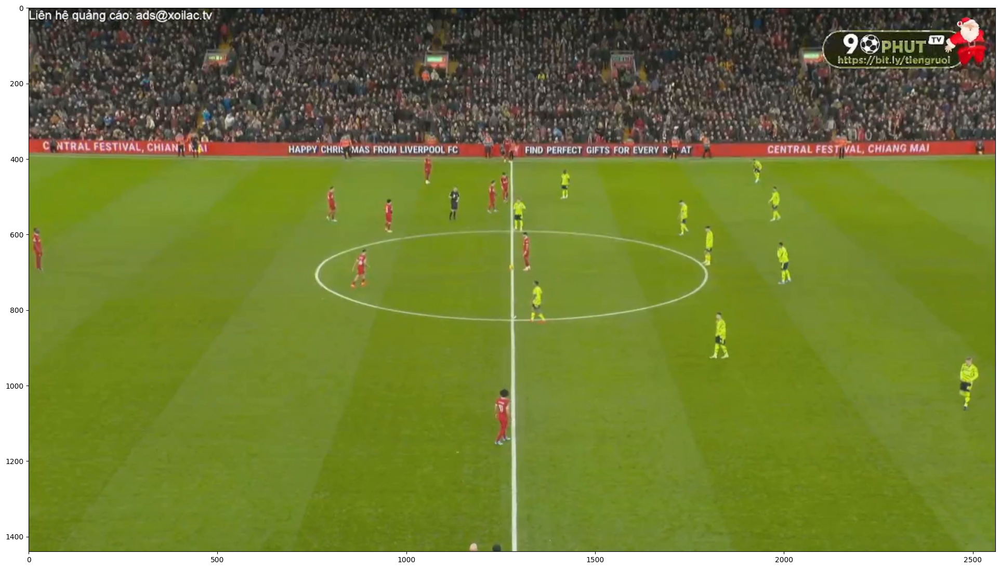

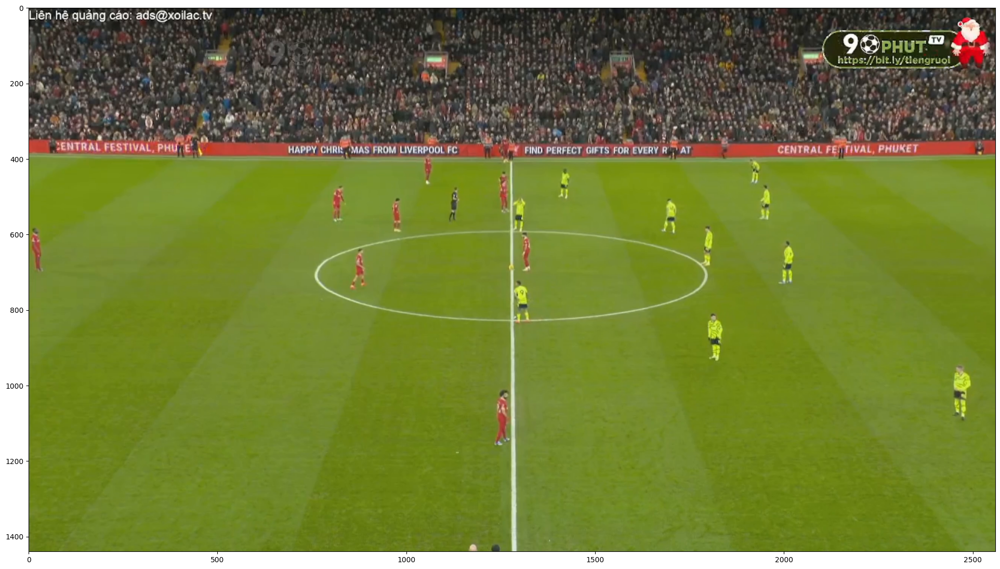

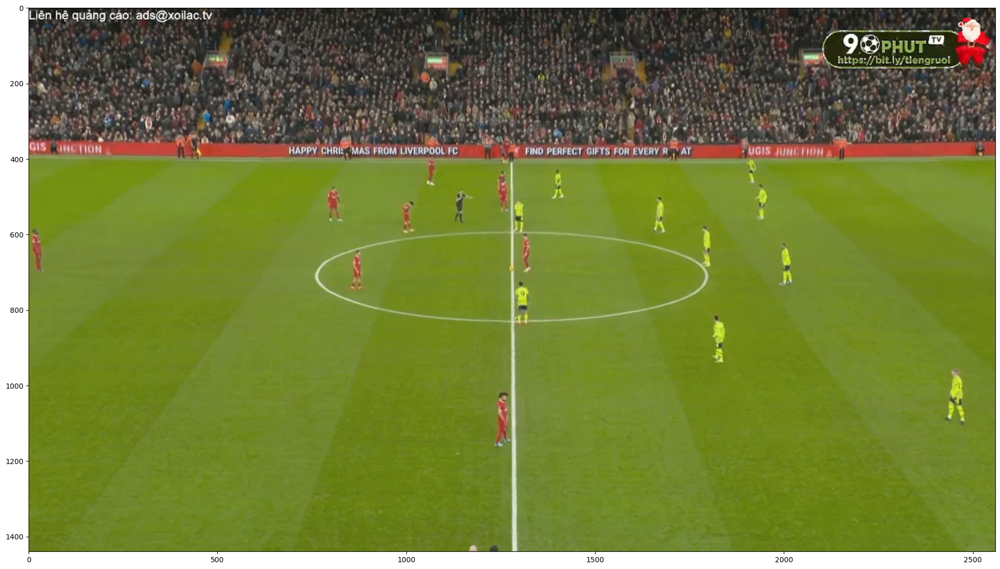

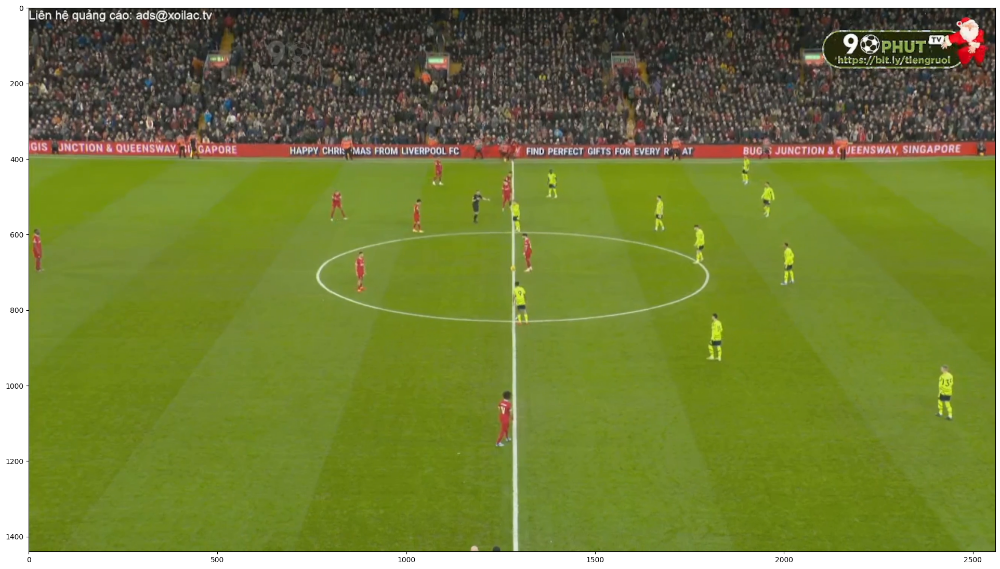

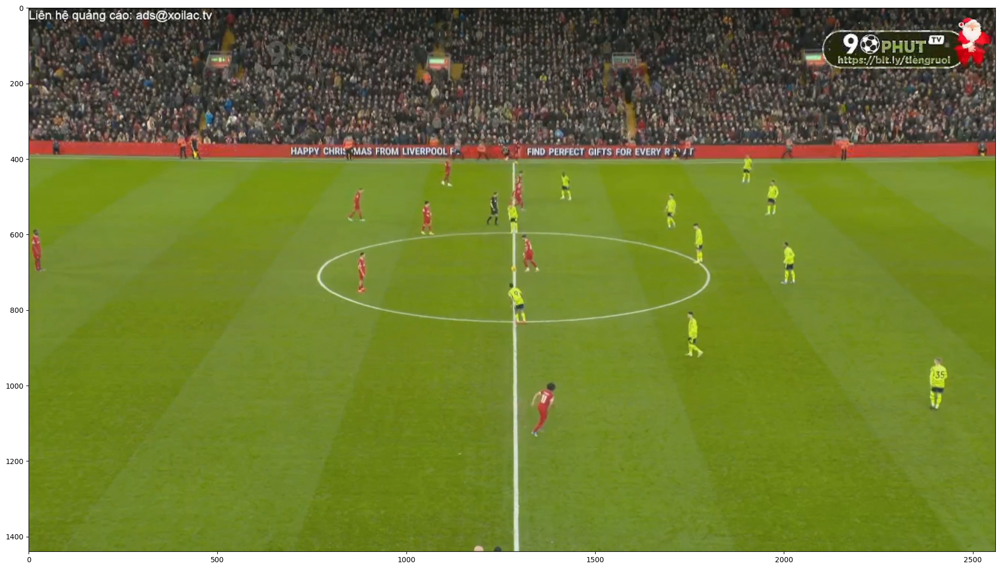

In [4]:
frame_rate = 5
window_of_frames = []

for frame_number in range(frame_rate):
    image_path = os.path.join(images_path, os.listdir(images_path)[frame_number])
    rgb_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)
    window_of_frames.append(rgb_image)

    plt.figure()
    plt.imshow(rgb_image[:, :, ::-1])
    plt.show()

In [5]:


center_coordinates_list = []
ball_center_coordinates_list = []
bottom_line_centers_list = []
results_list = []
for index, rgb_image in enumerate(window_of_frames):
    temp = rgb_image.copy()
    center_coordinates = []
    ball_center_coordinates = []
    bottom_line_centers = []

    results = model.predict(rgb_image)
    results_list.append(results)

    for result in results:
        boxes = result.boxes
        classes = result.names
        for box in boxes:
            coord = box.xyxy.cpu().detach().int().tolist()[0]
            class_id = box.cls[0].item()
            if class_id != 1.0:
                (startX, startY, endX, endY) = coord
                cv2.rectangle(temp, (startX, startY), (endX, endY), (255, 0, 0), 2)

                centerX, centerY = box_center(coord)
                center_coordinates.append((centerX, centerY))
                cv2.circle(temp, (centerX, centerY), 5, (0, 0, 255), -1)

                bottom_centerX, bottom_centerY = box_bottom_coord(coord)
                bottom_line_centers.append((bottom_centerX, bottom_centerY))
                cv2.circle(temp, (bottom_centerX, bottom_centerY), 5, (0, 255, 0), -1)

            else:
                (ball_startX, ball_startY, ball_endX, ball_endY) = coord
                cv2.rectangle(temp, (ball_startX, ball_startY), (ball_endX, ball_endY), (0, 0, 255), 2)

                ball_centerX, ball_centerY = box_center(coord)
                ball_center_coordinates.append((ball_centerX, ball_centerY))
                cv2.circle(temp, (ball_centerX, ball_centerY), 5, (255, 0, 0), 1)
        
    if index == 0 or index == len(window_of_frames) - 1:  
        for center_coord, bottom_center in zip(center_coordinates, bottom_line_centers):
            print("Center Coordinates:", center_coord)
            print("Bottom Line Center:", bottom_center)

        for ball_coord in ball_center_coordinates:
            print("Ball Center Coordinates:", ball_coord)
        plt.figure()
        plt.imshow(temp[:,:,::-1])
    center_coordinates_list.append(center_coordinates)
    ball_center_coordinates_list.append(ball_center_coordinates)
    bottom_line_centers_list.append(bottom_line_centers)

NameError: name 'model' is not defined

Center Coordinates: (560, 406)
Bottom Line Center: (560, 449)
Center Coordinates: (1046, 416)
Bottom Line Center: (1046, 457)
Center Coordinates: (599, 520)
Bottom Line Center: (599, 564)
Center Coordinates: (91, 316)
Bottom Line Center: (91, 358)
Center Coordinates: (467, 324)
Bottom Line Center: (467, 359)
Center Coordinates: (773, 274)
Bottom Line Center: (773, 312)
Center Coordinates: (960, 414)
Bottom Line Center: (960, 454)
Center Coordinates: (530, 267)
Bottom Line Center: (530, 303)
Center Coordinates: (506, 506)
Bottom Line Center: (506, 558)
Center Coordinates: (51, 402)
Bottom Line Center: (51, 446)
Center Coordinates: (904, 124)
Bottom Line Center: (904, 155)
Center Coordinates: (134, 470)
Bottom Line Center: (134, 518)
Center Coordinates: (346, 667)
Bottom Line Center: (346, 688)
Center Coordinates: (899, 426)
Bottom Line Center: (899, 468)
Center Coordinates: (254, 674)
Bottom Line Center: (254, 690)
Center Coordinates: (1245, 63)
Bottom Line Center: (1245, 120)
Ball Cent

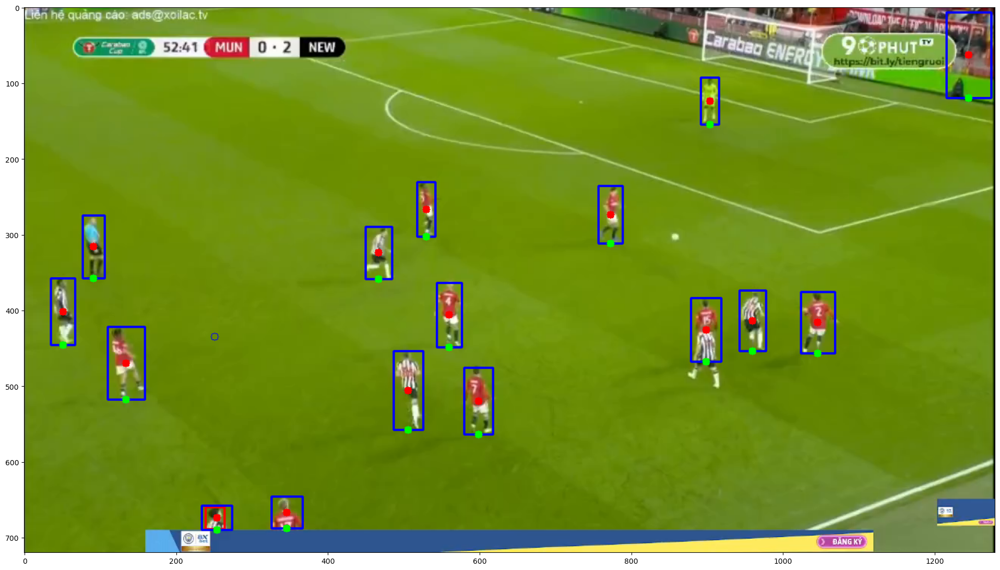

Center Coordinates: (662, 522)
Bottom Line Center: (662, 556)
Center Coordinates: (386, 383)
Bottom Line Center: (386, 417)
Center Coordinates: (320, 592)
Bottom Line Center: (320, 640)
Center Coordinates: (914, 465)
Bottom Line Center: (914, 500)
Center Coordinates: (582, 389)
Bottom Line Center: (582, 424)
Center Coordinates: (256, 268)
Bottom Line Center: (256, 294)
Center Coordinates: (928, 318)
Bottom Line Center: (928, 347)
Center Coordinates: (1091, 354)
Bottom Line Center: (1091, 391)
Center Coordinates: (139, 208)
Bottom Line Center: (139, 232)
Center Coordinates: (720, 217)
Bottom Line Center: (720, 242)
Center Coordinates: (12, 533)
Bottom Line Center: (12, 602)


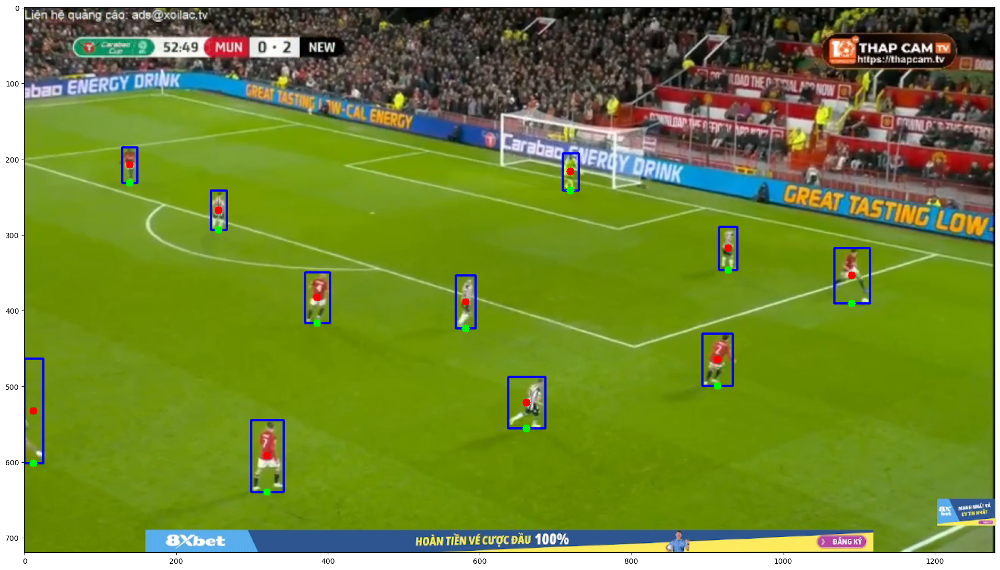

In [ ]:
for index, (results, rgb_image, center_coordinates, ball_center_coordinates, bottom_line_centers) in enumerate( \
    zip(results_list, window_of_frames, center_coordinates_list, ball_center_coordinates_list, bottom_line_centers_list)):
    distance_threshold = 20
    boxes_to_remove = []
    for i in range(len(center_coordinates)):
        for j in range(i + 1, len(center_coordinates)):
            distance = np.linalg.norm(np.array(center_coordinates[i]) - np.array(center_coordinates[j]))
            if distance < distance_threshold:
                boxes_to_remove.extend([i, j])

    new_boxes = [box for i, box in enumerate(results[0].boxes) if i not in boxes_to_remove]
    center_coordinates = []
    bottom_line_centers = []
    ball_center_coordinates = []

    temp = rgb_image.copy()
    for box in new_boxes:
        coord = box.xyxy.cpu().detach().int().tolist()[0]
        class_id = box.cls[0].item()
        if class_id != 1.0:
            (startX, startY, endX, endY) = coord
            cv2.rectangle(temp, (startX, startY), (endX, endY), (255, 0, 0), 2)

            centerX = (startX + endX) // 2
            centerY = (startY + endY) // 2
            center_coordinates.append((centerX, centerY))
            cv2.circle(temp, (centerX, centerY), 5, (0, 0, 255), -1)

            bottom_centerX = (startX + endX) // 2
            bottom_centerY = endY
            bottom_line_centers.append((bottom_centerX, bottom_centerY))
            cv2.circle(temp, (bottom_centerX, bottom_centerY), 5, (0, 255, 0), -1)

        else:
            (ball_startX, ball_startY, ball_endX, ball_endY) = coord
            cv2.rectangle(temp, (ball_startX, ball_startY), (ball_endX, ball_endY), (0, 0, 255), 2)

            ball_centerX = (ball_startX + ball_endX) // 2
            centerY = (ball_startY + ball_endY) // 2
            ball_center_coordinates.append((ball_centerX, ball_centerY))
            cv2.circle(temp, (ball_centerX, ball_centerY), 5, (255, 0, 0), 1)
    if index == 0 or index == len(window_of_frames) - 1: 
        for center_coord, bottom_center in zip(center_coordinates, bottom_line_centers):
            print("Center Coordinates:", center_coord)
            print("Bottom Line Center:", bottom_center)

        for ball_coord in ball_center_coordinates:
            print("Ball Center Coordinates:", ball_coord)

        plt.figure()
        plt.imshow(temp[:, :, ::-1])
        plt.show()